# NR 427 Final Project
Eileen McGinnity - May 6, 2024

The purpose of this project is to investigate the safety of Colorado's jurisdictional dams. A jurisdictional dam is a dam large enough to pose a threat to human life and/or cause damage, should the dam break. Colorado's Department of Water Resources (DWR) Decision Support Systems inspect these dams and reports on the hazard level. The hazard levels are defined as follows:
* High: high chance of deaths and widespread damage if one of these dams break.
* Significant: no deaths expected, but significant damage will occur if one of these dams break.
* Low: no expected deaths, but some non-critical infrastructural damage expected.
* No Public Hazard (NPH): the public should not be directly affected by a dam break.

The main tasks of this notebook are:
1. Importing libraries and data; setting up paths
2. Editing/cleaning data 
3. Creating pie charts to display data
4. Performing buffers and spatial joins
5. Creating an interactive folium map

Dam data from the DWR's Decision Support System was used to filter data, calculate dams per hazard level and per county, plot locations on a map, and perform buffers around the locations. The Colorado State Demography Office's 2020 census tract data was used to calculate statistics on how many people would be affected by a dam break of each hazard level within a 10 mile radius. Colorado Department of Local Affairs' county boundary shapefile was used to display popups for each county on the interactive map. 

This notebook only uses open source python libraries.

<b>TWO NOTES BEFORE RUNNING:</b>

1. Remember to change the main_path to the location where this file is saved.

2. kaleido version 0.1.0 is required. This is NOT the latest version; use the code below to install the right version)

In [1]:
####### to download kaleido v.0.1.0:
#!pip install kaleido==0.1.0post1

## 1: Importing libraries and data; setting up paths

In [2]:
print("******SCRIPT STARTING******")

******SCRIPT STARTING******


In [3]:
# import libraries
import requests, os, zipfile, folium, kaleido, base64, sys
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import plotly.express as px
from shapely.geometry import Point
import folium.plugins as plugins

In [4]:
##### ONLY CHANGE THIS PATH — this should be the location where this file is saved #####
main_path = r"C:\Users\mcgin\Documents\Grad School\Spring 2024\NR 426-7 - Programming for GIS\NR 427\Final Project"
########################################################################################

if os.path.exists(main_path):
    os.chdir(main_path)
    print(f"Your main path is currently set to: {os.getcwd()}")
else:
    sys.exit("Main path is incorrect. Ending script.")

Your main path is currently set to: C:\Users\mcgin\Documents\Grad School\Spring 2024\NR 426-7 - Programming for GIS\NR 427\Final Project


In [5]:
# creating data folder
data_folder = "data"
data_path = os.path.join(main_path, data_folder)
#print(os.getcwd())

try:
    if not os.path.exists(data_path):
        print("Data folder does not yet exist; creating...")
        os.mkdir(data_folder)
        data_path = os.path.join(main_path, data_folder)
    else:
        print("Data folder already exists.")
except Exception as e:
    print(f"Error occurred: {e}")    

Data folder does not yet exist; creating...


In [6]:
# creating output folder
output_folder = "output"
output_path = os.path.join(main_path, output_folder)
#print(os.getcwd())

try:
    if not os.path.exists(output_path):
        print("Output folder does not yet exist; creating...")
        os.mkdir(output_folder)
        output_path = os.path.join(main_path, output_folder)
    else:
        print("Output folder already exists.")
except Exception as e:
    print(f"Error occurred: {e}")

Output folder does not yet exist; creating...


In [7]:
# changing wd to data folder
os.chdir(data_path)

# downloading CO census tract data (2020)
# via: https://demography.dola.colorado.gov/assets/html/gis.html#:~:text=2020%20Census%20Statistical%20Geography%20(with%20demographic%20characteristics)
census_zip_url = "https://storage.googleapis.com/co-publicdata/Census_Tract_Data_2020.zip"

# setting up variables and path for census zip file
census_zip_file = "Census_Tract_Data_2020.zip"
census_zip_path = os.path.join(data_path, census_zip_file)
#print(census_zip_path)

try:
    if not os.path.exists(census_zip_path):
        print("Downloading census data zipfile...")
        download = requests.get(census_zip_url)
        open(census_zip_path, "wb").write(download.content)
    else:
        print("Census data zipfile already exists.")
except Exception as e:
    print(f"Error occurred: {e}")

In [8]:
# creating census folder
census_folder = "CensusData"
census_folder_path = os.path.join(data_path, census_folder)

try:
    if not os.path.exists(census_folder_path):
        print("Folder to extract census data to does not yet exist; creating...")
        os.mkdir(census_folder)
        census_folder_path = os.path.join(data_path, census_folder)
    else:
        print("Census data folder already exists.")
except Exception as e:
    print(f"Error occurred: {e}")

Folder to extract census data to does not yet exist; creating...


In [9]:
# setting wd to census folder
os.chdir(census_folder_path)

# setting up variables and path for census data
census_shp_file = "Tract_Data_2020.shp"
census_shp_path = os.path.join(census_folder_path, census_shp_file)

# unzipping census data
try:
    if not os.path.exists(census_shp_path):
        if zipfile.is_zipfile(census_zip_path):
            print("Expected zipfile is present; extracting...")
            zip = zipfile.ZipFile(census_zip_path, 'r')
            zip.extractall()
    else:
        print("Census data zipfile already extracted.")
except Exception as e:
    print(f"Error occurred: {e}")
        
print(f"\tCensus data can be found: {census_folder_path}")

# reading in data
census_shp = gpd.read_file(census_shp_path)

if os.path.exists(census_shp_path):
    print("\nCensus data shapefile successfully extracted.")
else:
    print("\nCensus data shapefile was not found.")

Expected zipfile is present; extracting...
	Census data can be found: C:\Users\mcgin\Documents\Grad School\Spring 2024\NR 426-7 - Programming for GIS\NR 427\Final Project\data\CensusData

Census data shapefile successfully extracted.


In [10]:
# changing wd back to data folder
os.chdir(data_path)

# downloading CO county boundaries shapefile
# via https://www.coloradoview.org/colorado-gis/
counties_zip_url = "https://storage.googleapis.com/co-publicdata/lm_cnty.zip"

#  setting up variables and path for counties zip file
counties_zip_file = "lm_cnty.zip"
counties_zip_path = os.path.join(data_path, counties_zip_file)
#print(counties_zip_path)

try:
    if not os.path.exists(counties_zip_path):
        print("Downloading CO counties data zipfile...")
        download = requests.get(counties_zip_url)
        open(counties_zip_path, "wb").write(download.content)
    else:
        print("CO counties data zipfile already exists.")
except Exception as e:
    print(f"Error occurred: {e}")

In [11]:
# creating folder for counties data 
counties_folder = "COCounties"
counties_folder_path = os.path.join(data_path, counties_folder)

try:
    if not os.path.exists(counties_folder_path):
        print("Folder to extract CO counties data to does not yet exist; creating...")
        os.mkdir(counties_folder)
        counties_folder_path = os.path.join(data_path, counties_folder)
    else:
        print("CO counties folder already exists.")
except Exception as e:
    print(f"Error occurred: {e}")

Folder to extract CO counties data to does not yet exist; creating...


In [12]:
# changing wd to counties folder
os.chdir(counties_folder_path)

#  setting up variables and path for counties shp
counties_shp_file = "lm_cnty.shp"
counties_shp_path = os.path.join(counties_folder_path, counties_shp_file)

# extracting counties zipfile
try: 
    if not os.path.exists(counties_shp_path):
        if zipfile.is_zipfile(counties_zip_path):
            print("Expecting zipfile is present; extracting...")
            zip = zipfile.ZipFile(counties_zip_path, 'r')
            zip.extractall()
    else:
        print("Counties zipfile already extracted.")
except Exception as e:
    print(f"Error occurred: {e}")
    
print(f"\tCounties data can be found: {counties_folder_path}")

# reading in counties data
counties_shp = gpd.read_file(counties_shp_path)

if os.path.exists(counties_shp_path):
    print("\nCounties data shapefile successfully extracted.")
else:
    print("\nCounties data shapefile was not found.")

Expecting zipfile is present; extracting...
	Counties data can be found: C:\Users\mcgin\Documents\Grad School\Spring 2024\NR 426-7 - Programming for GIS\NR 427\Final Project\data\COCounties

Counties data shapefile successfully extracted.


In [13]:
# this one cannot be linked to download directly, so for ease I have included it
# via https://dwr.state.co.us/Tools/DamSafety/Dams?submitButton=Submit&SelectedGeoValue=waterDivisionDiv&SelectedPhysicalStatus=1&SelectedAdditionalValue=none

# creating path to existing data
dam_csv_file = "CDSS_SearchResults_DamSafety_202404231547.csv"
dam_path = os.path.join(main_path, dam_csv_file)

if os.path.exists(dam_path):
    print("\nDam safety data was found.")
else:
    print("\nDam safety data was not found. Please ensure dam safety csv is in your main path.")
    
# moving dam data into our data folder
new_dam_path = os.path.join(data_path, dam_csv_file)
os.rename(dam_path, new_dam_path)

if os.path.exists(new_dam_path):
    print(f"\tDam safety data was successfully moved.\n\tIt can be found: {data_path}")
else:
    print("\tDam safety data was not moved to the data folder.")


Dam safety data was found.
	Dam safety data was successfully moved.
	It can be found: C:\Users\mcgin\Documents\Grad School\Spring 2024\NR 426-7 - Programming for GIS\NR 427\Final Project\data


In [14]:
# changing wd back to data folder
os.chdir(data_path)

# reading in dam safety data to a dataframe
print("Reading in dam safety data...")
dam_df = pd.read_csv(dam_csv_file)

Reading in dam safety data...


## 2: Editing/cleaning data 

In [15]:
# looking at the counties data to see what might need to be changed
print("The columns in the counties shp are:")
for x in counties_shp.columns:
    print(f"\t{x}")
    
print("\nThe NAMELSAD10 column contains county name. Here are the first few values: ")
print(counties_shp.NAMELSAD10.head()) # NAMELSAD10 is the column for counties (we will change this)

The columns in the counties shp are:
	OBJECTID
	COUNTYFP
	Shape_Leng
	Shape_Area
	low
	lowmod
	LMMI
	lowmoduniv
	lowmod_pct
	NAMELSAD10
	geometry

The NAMELSAD10 column contains county name. Here are the first few values: 
0        Adams County
1      Alamosa County
2     Arapahoe County
3    Archuleta County
4         Baca County
Name: NAMELSAD10, dtype: object


In [16]:
print("Renaming the NAMELSAD10 column to County to make it more identifiable...")
# updating the column name to County
counties_shp.rename(columns={'NAMELSAD10': 'County'}, inplace=True)
print(f"\tIt is now: {counties_shp.columns[9]}")

print(f"\nWe don't want ' County' on the end of each of these county names, so we will remove them and convert the names to upper case. \nThis will keep the county names consistent with the dam data file and make it easier to do a spatial join later.")
counties_shp['County'] = counties_shp['County'].apply(lambda x: x[:-7].upper())
print("The first few values of the County column now look like this:")
print(counties_shp.County.head())

Renaming the NAMELSAD10 column to County to make it more identifiable...
	It is now: County

We don't want ' County' on the end of each of these county names, so we will remove them and convert the names to upper case. 
This will keep the county names consistent with the dam data file and make it easier to do a spatial join later.
The first few values of the County column now look like this:
0        ADAMS
1      ALAMOSA
2     ARAPAHOE
3    ARCHULETA
4         BACA
Name: County, dtype: object


In [17]:
# taking a look at the dam safety data
print(f"\nNext, we look at the dam safety data. The data frame has {len(dam_df)} rows.\nMany of these fields are unnecessary, so we will remove them.\n")
print(dam_df.head())


Next, we look at the dam safety data. The data frame has 3690 rows.
Many of these fields are unnecessary, so we will remove them.

   Dam ID                 Dam Name Other Dam Names   NID ID      WDID  \
0   10102        ADAMS & BUNKER #1             NaN  CO01761  103917.0   
1   10103        ADAMS & BUNKER #2             NaN  CO01762  103385.0   
2   10104        ADAMS & BUNKER #3        HEART #2  CO01189  103386.0   
3   10105               AGATE NO 1  BALL RESERVOIR  CO00002       NaN   
4   10107  ALLAN BROS. FLOOD CONT.             NaN      NaN       NaN   

      Administration Type Physical Status  Div   WD  County  ...  \
0      Jurisdictional Dam          Active  1.0  1.0    WELD  ...   
1  Non-Jurisdictional Dam          Active  1.0  1.0    WELD  ...   
2      Jurisdictional Dam          Active  1.0  1.0    WELD  ...   
3      Jurisdictional Dam          Active  1.0  1.0  ELBERT  ...   
4  Non-Jurisdictional Dam          Active  1.0  1.0    WELD  ...   

           Overall C

In [18]:
print("First, we will remove the spaces from the field names we will be keeping so that they are easier to refer to in code.")
print(f"Renaming {dam_df.columns[39]}, {dam_df.columns[1]}, and {dam_df.columns[5]} columns...")

#renaming field names
dam_df.rename(columns = {"Hazard Class":"HazardClass"}, inplace = True)
dam_df.rename(columns = {"Dam Name":"DamName"}, inplace = True)
dam_df.rename(columns = {"Administration Type":"AdministrationType"}, inplace = True)

print(f"\tThe columns are now {dam_df.columns[39]}, {dam_df.columns[1]}, and {dam_df.columns[5]}.")

First, we will remove the spaces from the field names we will be keeping so that they are easier to refer to in code.
Renaming Hazard Class, Dam Name, and Administration Type columns...
	The columns are now HazardClass, DamName, and AdministrationType.


In [19]:
print("Next, we will drop rows with missing or incorrect values and filter our data.")
print(f"\tDropping rows with na or incorrect values from latitude, longitude, and county columns...")

# temporarily making data into a new df
# dropping rows with na values from latitude, longitude, and County
new_df = dam_df.dropna(subset = ["Latitude", "Longitude", "County"])
# this one has incorrect coordinates so we will drop it too
new_df = new_df.drop(new_df[new_df['DamName'] == 'BRESSAN #2'].index)
print(f"\tFiltering out dams with a non-jurisdictional administration type...\n\tThis leaves only dams large enough to damage property or harm life if it breaks.")
# filtering data to drop rows with a non-jurisdictional administration type
new_df = new_df.drop(new_df[new_df["AdministrationType"] == "Non-Jurisdictional Dam"].index) 

print(f"\nThere are a total of {len(new_df)} valid jurisdictional dams in Colorado.")
#print(new_df.Latitude.head())
#print(new_df.head())

Next, we will drop rows with missing or incorrect values and filter our data.
	Dropping rows with na or incorrect values from latitude, longitude, and county columns...
	Filtering out dams with a non-jurisdictional administration type...
	This leaves only dams large enough to damage property or harm life if it breaks.

There are a total of 2154 valid jurisdictional dams in Colorado.


In [20]:
print("Now we look at the unique values of the County and Hazard Class columns to determine if any values need to be updated.")
print(new_df.County.unique())

print("There are a few misspellings and mistakes that we can replace, such as 'CHEYENE' to 'CHEYENNE' and 'Larimer County' to 'LARIMER'.\n\tUpdating County values...")
# updating values in the county column
new_df = new_df.replace({"County": {"Larimer County": "LARIMER"}})
new_df = new_df.replace({"County": {"San Miguel": "SAN MIGUEL"}})
new_df = new_df.replace({"County": {"LC": "LINCOLN"}})
new_df = new_df.replace({"County": {"Kiowa": "KIOWA"}})
new_df = new_df.replace({"County": {"CHEYENE": "CHEYENNE"}})
# print(new_df.County.unique())

print(f"\nWe also will update the values of 'N' and 'NPH' from the HazardClass field to make them more descriptive.")
print(new_df.HazardClass.unique())
print(f"\tUpdating 'N' to 'No Data/Unknown' and 'NPH' to 'No Public Hazard'...")
# updating values in the HazardClass column
new_df = new_df.replace({"HazardClass": {"N": "No Data/Unknown"}})
new_df = new_df.replace({"HazardClass": {"NPH": "No Public Hazard"}})
print(new_df.HazardClass.unique())

Now we look at the unique values of the County and Hazard Class columns to determine if any values need to be updated.
['WELD' 'ELBERT' 'MORGAN' 'EL PASO' 'ARAPAHOE' 'ADAMS' 'BROOMFIELD'
 'JEFFERSON' 'DENVER' 'LARIMER' 'BOULDER' 'Larimer County' 'GILPIN'
 'CLEAR CREEK' 'DOUGLAS' 'TELLER' 'CHAFFEE' 'LAKE' 'SAGUACHE' 'FREMONT'
 'CUSTER' 'PUEBLO' 'LAS ANIMAS' 'HUERFANO' 'BENT' 'KIOWA' 'CROWLEY' 'LC'
 'OTERO' 'LINCOLN' 'MINERAL' 'RIO GRANDE' 'HINSDALE' 'CONEJOS' 'ARCHULETA'
 'PARK' 'COSTILLA' 'GUNNISON' 'SAN JUAN' 'LA PLATA' 'MONTEZUMA' 'DOLORES'
 'SUMMIT' 'GRAND' 'EAGLE' 'PITKIN' 'GARFIELD' 'DELTA' 'MESA' 'MONTROSE'
 'RIO BLANCO' 'MOFFAT' 'ROUTT' 'JACKSON' 'YUMA' 'KIT CARSON' 'SAN MIGUEL'
 'San Miguel' 'LOGAN' 'SEDGWICK' 'WASHINGTON' 'PHILLIPS' 'PROWERS'
 'CHEYENE' 'BACA' 'OURAY']
There are a few misspellings and mistakes that we can replace, such as 'CHEYENE' to 'CHEYENNE' and 'Larimer County' to 'LARIMER'.
	Updating County values...

We also will update the values of 'N' and 'NPH' from 

In [21]:
print("Removing unnecessary columns from the dataframe...")
# removing unnecessary columns
new_df = new_df[['DamName', 'County', 'HazardClass', 'Latitude', 'Longitude']].copy()
print("The dataframe now only contains columns:")
for x in new_df.columns:
    print(f"\t{x}")

Removing unnecessary columns from the dataframe...
The dataframe now only contains columns:
	DamName
	County
	HazardClass
	Latitude
	Longitude


Converting the dataframe into a geodataframe using the latitude/longitude columns...
The geodataframe now includes a geometry column for plotting, like below.
	DamName
	County
	HazardClass
	Latitude
	Longitude
	geometry


<AxesSubplot: >

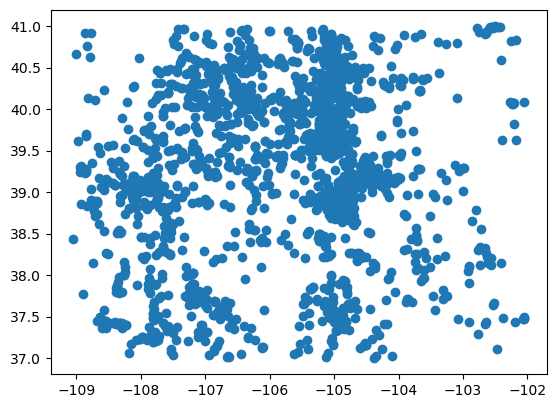

In [22]:
print("Converting the dataframe into a geodataframe using the latitude/longitude columns...")
# converting the pandas dataframe into a geopandas geodataframe using lon/lat columns 
dam_gdf = gpd.GeoDataFrame(new_df, geometry = gpd.points_from_xy(new_df.Longitude, new_df.Latitude), crs = "EPSG:4326")
print("The geodataframe now includes a geometry column for plotting, like below.")
for x in dam_gdf.columns:
    print(f"\t{x}")

# showing dam locations
dam_gdf.plot()

## 3: Creating pie charts to display data
Each chart will be used as a popup on the final map

<b>Some notes:</b>
    
Unfortunately, the write_html plotly function doesn't seem to output in the correct format for use in a folium popup, so I had to go with images instead:
https://stackoverflow.com/questions/77571320/no-plotly-graph-in-folium-popup?noredirect=1&lq=1#:~:text=As%20it%20worked%2C%20I%20could%20conclude%20that%20the%20html%20file%20given%20by%20write_html%20of%20the%20plotly%20express%20figure%20was%20the%20weak%20spot.

Also, I had to revert to an older version of kaleido to save images:
https://stackoverflow.com/questions/70997997/not-able-to-save-plotly-plots-using-to-image-or-write-image

In [23]:
print("Grouping dam safety data by County and Hazard Class...")
county_hz_count = dam_gdf.groupby(['County', 'HazardClass']).size().reset_index(name="count")
print("Example: Adams County")
county_hz_count.head(4)

Grouping dam safety data by County and Hazard Class...
Example: Adams County


,County,HazardClass,count
0,ADAMS,High,8
1,ADAMS,Low,15
2,ADAMS,No Public Hazard,6
3,ADAMS,Significant,7


In [24]:
# setting up dictionary to match hazard class level to color
colors = {'No Public Hazard':'green', 'Low': 'yellow', 'Significant': 'orange', 'High': 'red', 'No Data/Unknown': 'lightgray'}

print("Creating pie chart for all jurisdictional dams in Colorado...")
fig = px.pie(county_hz_count,
             values = "count",
             names = "HazardClass",
             title = f"<b>Jurisdictional Dams in Colorado by Hazard Class Level<b><br><sup>{len(new_df)} Total Dams</sup>",
             color = "HazardClass",
             color_discrete_map = colors) # setting colormap to colors dictionary
fig.update_layout(template = 'plotly_dark', # using premade dark theme 
                  showlegend=True,
                  font = dict(size = 25),
                 title = dict(font = dict(size = 30)),
                 width = 1000,
                 height = 1000)
fig.update_traces(textinfo='value+percent', # showing both raw count and percentage
                 marker = dict(line = dict(color = 'white', width = 2)))

print("Figure created:")
# show figure
fig.show() 

# creating variable and path for figure
fig1 = "CO_dams_by_hazard.png"
fig_path = os.path.join(output_path, fig1)

# save figure to output folder
try:
    if not os.path.exists(fig_path):
        fig.write_image(fig_path) 
        print(f"Colorado dams by hazard level pie chart saved to: {fig_path}")
    else:
        print(f"Colorado dams by hazard level pie chart already saved.\nDelete from {output_path} if any changes have been made to the code.")
except Exception as e:
    print(f"Error occurred: {e}")

Creating pie chart for all jurisdictional dams in Colorado...
Figure created:


Colorado dams by hazard level pie chart saved to: C:\Users\mcgin\Documents\Grad School\Spring 2024\NR 426-7 - Programming for GIS\NR 427\Final Project\output\CO_dams_by_hazard.png


In [25]:
print("Grouping dam safety data by county and counting total number of dams per county...")
# getting the total for each county so that we can display this number as the subtitle on figures
county_total = dam_gdf.groupby(['County']).size().reset_index(name="count")
print("First five rows:")
county_total.head()

Grouping dam safety data by county and counting total number of dams per county...
First five rows:


,County,count
0,ADAMS,36
1,ARAPAHOE,25
2,ARCHULETA,24
3,BACA,13
4,BENT,9


In [26]:
# iteratively creating pie charts for each county

# creating an empty list of counties for use later during mapping/matching county geometry to popups
county_list = []

print("Creating pie chart for each county...")
for county in county_hz_count.County.unique():
    filter = county_hz_count[county_hz_count['County'] == county] # this filter pulls out the number of dams of each hazard level for just the current county
    filter2 = county_total[county_total['County'] == county] # this filter pulls out just the total number of dams per county
    county_list.append(county) # appending name to county list for later use
    # creating pie chart
    p = px.pie(filter,
               values="count",
               names="HazardClass",
               title = f"<b>{county.title()} County Dams by Hazard Level<b><br><sup>{filter2.iloc[0]['count']} Total Dams</sup>",
               color = "HazardClass",
               color_discrete_map = colors) # using colors dictionary from above
    p.update_layout(template = 'plotly_dark',
                  showlegend=False, # change to True if wanted on the graphic itself; turned off here because a seperate legend will be present on the map where these will be shown
                  font = dict(size = 25),
                 title = dict(font = dict(size = 30)),
                 width = 1000,
                 height = 1000)
    p.update_traces(textinfo='value+percent',
                 marker = dict(line = dict(color = 'white', width = 2)))

    if not os.path.exists(f"{output_path}\\{county}.png"):
        p.write_image(f"{output_path}\\{county}.png")
        
print(f"County pie charts completed and saved. See {output_path} for each figure.") 

Creating pie chart for each county...
County pie charts completed and saved. See C:\Users\mcgin\Documents\Grad School\Spring 2024\NR 426-7 - Programming for GIS\NR 427\Final Project\output for each figure.


## 4: Performing buffers and spatial joins

Changing CRS of the dams geodataframe to NAD83/UTM Zone 13N...
	Now set to: EPSG:26913
Changing CRS of the census data to NAD83/UTM Zone 13N...
Now set to: EPSG:26913

Dam locations pre-buffer:


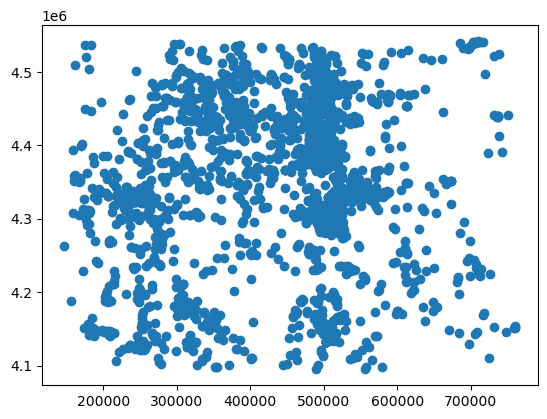

Buffering dam locations 10 miles...
Dams layer successfully buffered:


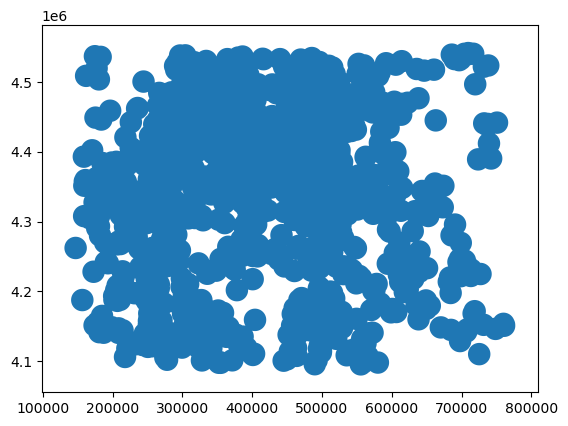

Visual check to ensure buffer looks correct and is on top of Colorado:


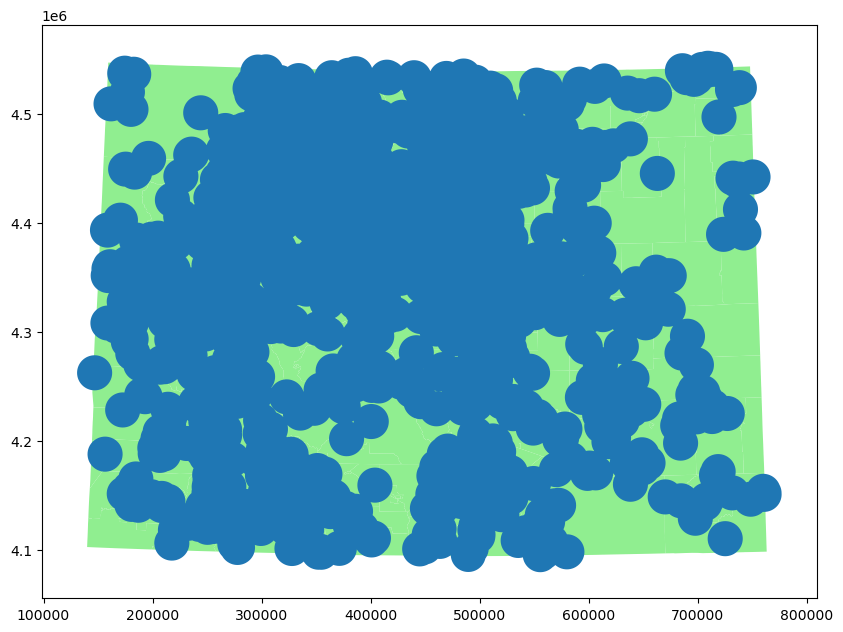

In [27]:
# making a copy of dam_gdf for all dams in CO
buffer_gdf = dam_gdf.copy()
total_buffer_gdf = dam_gdf.copy()

# changing crs to one good for calculating distance (NAD83/UTM Zone 13N)
# dam_gdf:
try:
    if not buffer_gdf.crs == 26913:
        print("Changing CRS of the dams geodataframe to NAD83/UTM Zone 13N...")
        buffer_gdf = buffer_gdf.to_crs(epsg=26913)
        print(f"\tNow set to: {buffer_gdf.crs}")
    else:
        print("\tCRS of the dams geodataframe is already NAD83/UTM Zone 13N.")
except Exception as e:
    print(f"Error occurred: {e}")
    
# census_shp:
try:
    if not census_shp.crs == 26913:
        print("Changing CRS of the census data to NAD83/UTM Zone 13N...")
        census_shp = census_shp.to_crs(epsg=26913)
        print(f"Now set to: {census_shp.crs}")
    else:
        print("CRS of the census data is already NAD83/UTM Zone 13N.")
except Exception as e:
    print(f"Error occurred: {e}")
    
# starting buffer
print("\nDam locations pre-buffer:")
# before buffer
buffer_gdf.geometry.plot()
plt.show()

print("Buffering dam locations 10 miles...")
# the buffer, then combining the buffer all into one polygon, then remaking it into a gdf
try:
    total_buffer_gdf['geometry'] = buffer_gdf['geometry'].buffer(16093.4) # 10 miles
    total_merged_buffer = total_buffer_gdf.unary_union # combining the buffer into one multipolygon layer
    total_buffer_gdf = gpd.GeoDataFrame(geometry=[total_merged_buffer], crs=buffer_gdf.crs) # conversion from geoseries back to geodataframe
except Exception as e:
    print(f"Error occurred: {e}")
    
# after buffer
print("Dams layer successfully buffered:")
total_buffer_gdf.geometry.plot()
plt.show()

# showing the two layers to ensure that they overlap correctly
print("Visual check to ensure buffer looks correct and is on top of Colorado:")
fig, ax = plt.subplots(figsize=(10, 10))
census_shp.plot(ax=ax, color = "lightgreen")
total_buffer_gdf.geometry.plot(ax=ax)
plt.show()

In [28]:
print("Performing spatial join on the buffered dams and the census tract data...")
# performing a spatial join on the buffer polygon and the census tract data
# this brings the total pop column from the census data to determine population in the radius of the dams
total_dam_census_join = gpd.sjoin(total_buffer_gdf, census_shp, how="inner")
print("Spatial join complete.")

Performing spatial join on the buffered dams and the census tract data...
Spatial join complete.


In [29]:
# total population calculations whole state all jurisdictional dams
total_population_within_buffer = total_dam_census_join['TOTALPOP'].sum()
print(f"Approximately {total_population_within_buffer:,d} Coloradans live within 10 miles of a dam large enough to cause property damage and harm life.")

Approximately 5,755,355 Coloradans live within 10 miles of a dam large enough to cause property damage and harm life.


In [30]:
# creating gdfs for each hazard level (excluding no hazard/no data)
print("Creating and filtering geodatabases for each hazard level...")

# high hazard level
high_buffer_gdf = buffer_gdf.copy() # make a copy of the original gdf
high_buffer_gdf = high_buffer_gdf[high_buffer_gdf['HazardClass'] == 'High'] # filter for just that hazard level

# significant hazard level
significant_buffer_gdf = buffer_gdf.copy()
significant_buffer_gdf = significant_buffer_gdf[significant_buffer_gdf['HazardClass'] == 'Significant']

# low hazard level
low_buffer_gdf = buffer_gdf.copy()
low_buffer_gdf = low_buffer_gdf[low_buffer_gdf['HazardClass'] == 'Low']

# no public hazard level
nph_buffer_gdf = buffer_gdf.copy()
nph_buffer_gdf = nph_buffer_gdf[nph_buffer_gdf['HazardClass'] == 'No Public Hazard']

print("\tCreating and filtering done.")

Creating and filtering geodatabases for each hazard level...
	Creating and filtering done.


In [31]:
# creating buffers, then combining each buffer, then remaking into a gdfs
print("Buffering geodatabases for each hazard level...")

# high hazard level
high_buffer_gdf['geometry'] = high_buffer_gdf['geometry'].buffer(16093.4) # 10 miles
high_merged_buffer = high_buffer_gdf.unary_union # combining into one multipolygon
high_buffer_gdf = gpd.GeoDataFrame(geometry=[high_merged_buffer], crs=high_buffer_gdf.crs) # geoseries to gdf

# significant hazard level
significant_buffer_gdf['geometry'] = significant_buffer_gdf['geometry'].buffer(16093.4) # 10 miles
significant_merged_buffer = significant_buffer_gdf.unary_union
significant_buffer_gdf = gpd.GeoDataFrame(geometry=[significant_merged_buffer], crs=significant_buffer_gdf.crs)

# low hazard level
low_buffer_gdf['geometry'] = low_buffer_gdf['geometry'].buffer(16093.4) # 10 miles
low_merged_buffer = low_buffer_gdf.unary_union
low_buffer_gdf = gpd.GeoDataFrame(geometry=[low_merged_buffer], crs=low_buffer_gdf.crs)

# no public hazard level
nph_buffer_gdf['geometry'] = nph_buffer_gdf['geometry'].buffer(16093.4) # 10 miles
nph_merged_buffer = nph_buffer_gdf.unary_union
nph_buffer_gdf = gpd.GeoDataFrame(geometry=[nph_merged_buffer], crs=nph_buffer_gdf.crs)

print("Buffering done.")

Buffering geodatabases for each hazard level...
Buffering done.


In [32]:
# performing the spatial joins
print("Performing spatial joins on the census tract data and the hazard level geodataframes...")

high_dam_census_join = gpd.sjoin(high_buffer_gdf, census_shp, how="inner")

significant_dam_census_join = gpd.sjoin(significant_buffer_gdf, census_shp, how="inner")

low_dam_census_join = gpd.sjoin(low_buffer_gdf, census_shp, how="inner")

nph_dam_census_join = gpd.sjoin(nph_buffer_gdf, census_shp, how="inner")

print("Spatial joins complete.")

Performing spatial joins on the census tract data and the hazard level geodataframes...
Spatial joins complete.


In [33]:
# total population calculations for wthin 10 miles of each hazard class dams
print("Calculating population living within 10 miles of dams of each hazard level...")

high_population_within_buffer = high_dam_census_join['TOTALPOP'].sum()
print(f"\nApproximately {high_population_within_buffer:,d} Coloradans live within 10 miles of a high-hazard level dam. There is a very high chance of deaths and widespread damage if one of these dams break.")

significant_population_within_buffer = significant_dam_census_join['TOTALPOP'].sum()
print(f"\nApproximately {significant_population_within_buffer:,d} Coloradans live within 10 miles of a significant-hazard level dam. While there are no deaths expected, significant damage will occur if one of these dams break.")

low_population_within_buffer = low_dam_census_join['TOTALPOP'].sum()
print(f"\nApproximately {low_population_within_buffer:,d} Coloradans live within 10 miles of a low-hazard level dam. If one of these dams break, there should not be any expected deaths, but some non-critical infrastructural damage.")

nph_population_within_buffer = nph_dam_census_join['TOTALPOP'].sum()
print(f"\nApproximately {nph_population_within_buffer:,d} Coloradans live within 10 miles of a dam with no public hazard. If one of these dams break, the public should not be directly affected.")

Calculating population living within 10 miles of dams of each hazard level...

Approximately 5,644,369 Coloradans live within 10 miles of a high-hazard level dam. There is a very high chance of deaths and widespread damage if one of these dams break.

Approximately 5,603,113 Coloradans live within 10 miles of a significant-hazard level dam. While there are no deaths expected, significant damage will occur if one of these dams break.

Approximately 5,732,767 Coloradans live within 10 miles of a low-hazard level dam. If one of these dams break, there should not be any expected deaths, but some non-critical infrastructural damage.

Approximately 5,251,451 Coloradans live within 10 miles of a dam with no public hazard. If one of these dams break, the public should not be directly affected.


## 5: Creating an interactive folium map 

In [34]:
# changing the crs to WGS 84/Pseudo-Mercator to display on webmap

# counties_shp:
if not counties_shp.crs == 3857:
    print("Changing CRS of the CO counties shapefile to match basemap webmapping CRS...")
    counties_shp = counties_shp.to_crs(3857)
    print(f"\tCRS is now: {counties_shp.crs}")
else:
    print("CRS of the CO counties shapefile is already the same.")
    
# dam_gdf:
if not dam_gdf.crs == 3857:
    print("Changing CRS of the dam geodataframe to match basemap webmapping CRS...")
    dam_gdf = dam_gdf.to_crs(3857)
    print(f"\tCRS is now: {dam_gdf.crs}")
else:
    print("CRS of the dam geodataframe is already the same.")

Changing CRS of the CO counties shapefile to match basemap webmapping CRS...
	CRS is now: EPSG:3857
Changing CRS of the dam geodataframe to match basemap webmapping CRS...
	CRS is now: EPSG:3857


In [35]:
# creating a folium map
print("Creating a map of Colorado...")
co_map = folium.Map(location = [39, -105.6], # ~center of CO
                    width = 950,
                    height = 550,
                    zoom_start = 7,
                    tiles = "CartoDB.DarkMatterNoLabels")
#co_map

Creating a map of Colorado...


In [36]:
# visually showing the 10mi buffer around dams of each hazard class
print("Updating the CRS of the buffer hazard level geodataframes to match the base webmap...")
# changing crs'
high_buffer_gdf.to_crs(3857)
significant_buffer_gdf.to_crs(3857)
low_buffer_gdf.to_crs(3857)
nph_buffer_gdf.to_crs(3857)

# creating a feature group for all hazards—toggling this will turn off/on ALL sublayers
buffer_fg = folium.FeatureGroup(name = "10 mi Radius Hazards—ALL", show = False).add_to(co_map)
co_map.add_child(buffer_fg)
# creating the subfeaturegroups for each hazard radius
nph_buffer_sfg = folium.plugins.FeatureGroupSubGroup(buffer_fg, name = "No Public Hazard Areas", show = True).add_to(co_map)
low_buffer_sfg = folium.plugins.FeatureGroupSubGroup(buffer_fg, name = "Low Hazard Areas", show = True).add_to(co_map)
significant_buffer_sfg = folium.plugins.FeatureGroupSubGroup(buffer_fg, name = "Significant Hazard Areas", show = True).add_to(co_map)
high_buffer_sfg = folium.plugins.FeatureGroupSubGroup(buffer_fg, name = "High Hazard Areas", show = True).add_to(co_map)

# plotting the polygons
print("Plotting the dam hazard level buffer areas...")
# no public hazard
folium.GeoJson(nph_buffer_gdf,
              fill = True,
              color = "green",
              fill_opacity = .2,
              weight = 0).add_to(nph_buffer_sfg)
# low
folium.GeoJson(low_buffer_gdf,
              fill = True,
              color = "yellow",
              fill_opacity = .2,
              weight = 0).add_to(low_buffer_sfg)
# significant
folium.GeoJson(significant_buffer_gdf,
              fill = True,
              color = "orange",
              fill_opacity = .2,
              weight = 0).add_to(significant_buffer_sfg)
# high
folium.GeoJson(high_buffer_gdf,
              fill = True,
              color = "red",
              fill_opacity = .2,
              weight = 0).add_to(high_buffer_sfg)
print("Buffer areas are toggled off by default; to view, check out the layer control in the top right corner of the map!")
#co_map

Updating the CRS of the buffer hazard level geodataframes to match the base webmap...
Plotting the dam hazard level buffer areas...
Buffer areas are toggled off by default; to view, check out the layer control in the top right corner of the map!


In [37]:
print("Assigning pie chart popups to each county and plotting county polygons...")
# creating a feature group to toggle CO counties layer off/on
counties_fg = folium.FeatureGroup(name = "CO Counties", show = True).add_to(co_map)

# iteratively assigning the pie charts for each county to the geometry of said county
for county in county_list:
    county_geom = counties_shp.loc[counties_shp['County'] == county, 'geometry']
    image_path = os.path.join(f"{output_path}\\{county}.png")
    if os.path.exists(image_path):
        with open(image_path, "rb") as image_file:
            encoded_image = base64.b64encode(image_file.read()).decode('utf-8') # need base64 for loading local imgs
        # setting popups
        popup_content = f'<img src="data:image/png;base64,{encoded_image}" alt="Image" style="width:350px;height:350px;">'
        popup = folium.Popup(html=popup_content)
        # plotting the county polygons
        folium.GeoJson(county_geom,
                       fill = True,
                       color = "darkgray",
                       fill_opacity = .10,
                       weight = .5,
                       popup = popup,
                       lazy = True
                      ).add_to(counties_fg)
#co_map

Assigning pie chart popups to each county and plotting county polygons...


In [38]:
print("Plotting Alamosa county polygon...")
# Alamosa is the only county without any valid jurisdictional dams
# we will plot this one separately since it won't have a pie chart popup

alamosa_row = counties_shp.loc[counties_shp['County'] == 'ALAMOSA']
alamosa_gdf = gpd.GeoDataFrame(alamosa_row, crs=counties_shp.crs)

folium.GeoJson(alamosa_gdf,
               fill = True,
               color = "darkgray",
               fill_opacity = 1,
               weight = .25,
               popup = folium.GeoJsonPopup(fields = ["County", "COUNTYFP"]),
               lazy = False
              ).add_to(counties_fg) # adding to the same fg as above

#co_map

Plotting Alamosa county polygon...


In [39]:
# creating a feature group to toggle CO dam locations off/on
dams_fg = folium.FeatureGroup(name="Dams", show = True).add_to(co_map)

print("Plotting dam locations by hazard level...")
# used chatgpt for how to iteratively add the points to the map
for _, row in dam_gdf.iterrows(): # chatgpt
    folium.CircleMarker([row['Latitude'], row['Longitude']], # chatgpt
                        radius = 0.1,
                        color = colors.get(row['HazardClass'], 'lightgray'), # uses the same color dict as we used in the pie charts
                        fill = True,
                        opacity = 0.75,
                        fill_opacity = 0,
                        tooltip=row['DamName'] # mouse over a dam and it will show the name of it
                       ).add_to(dams_fg)
    
folium.LayerControl().add_to(co_map) # adding the feature groups to the map
#co_map

Plotting dam locations by hazard level...


Creating a legend for the dam hazard levels on the map and for the pie charts...
Final map complete.
Try clicking on one of the counties! Check out the layers!



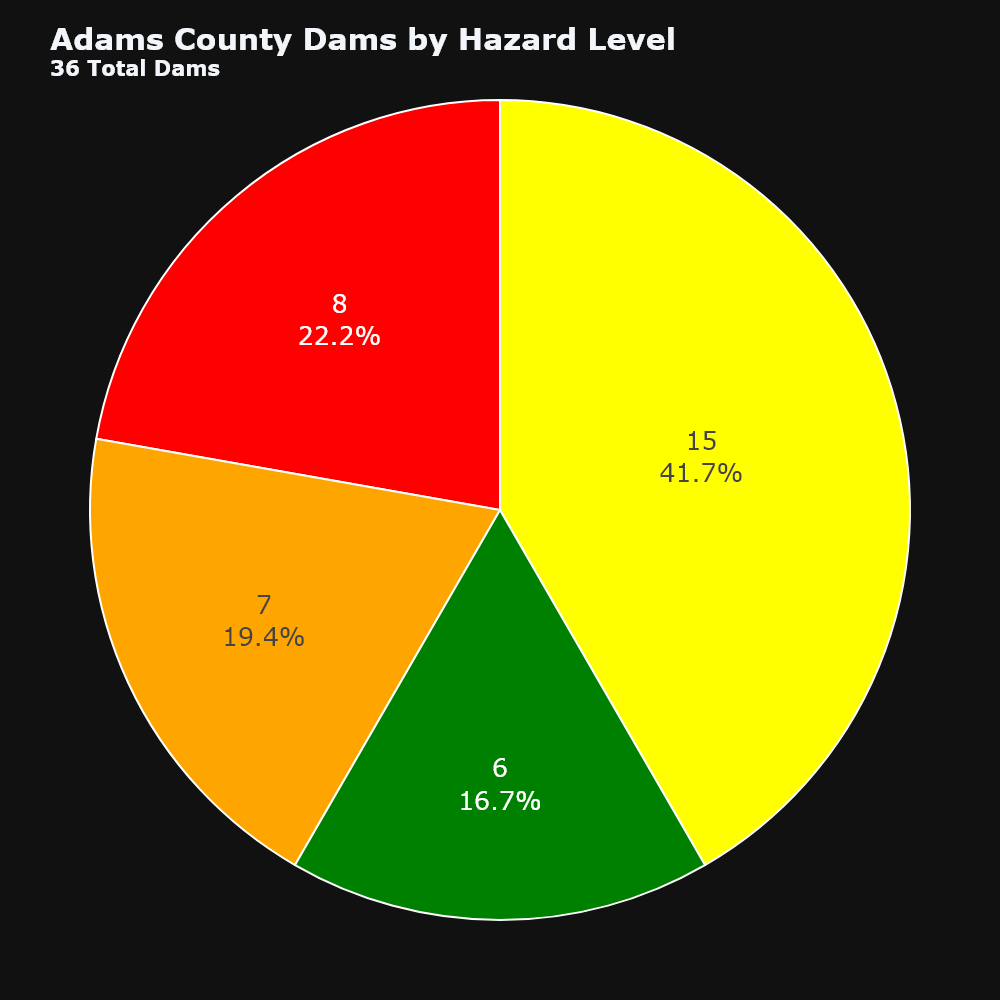
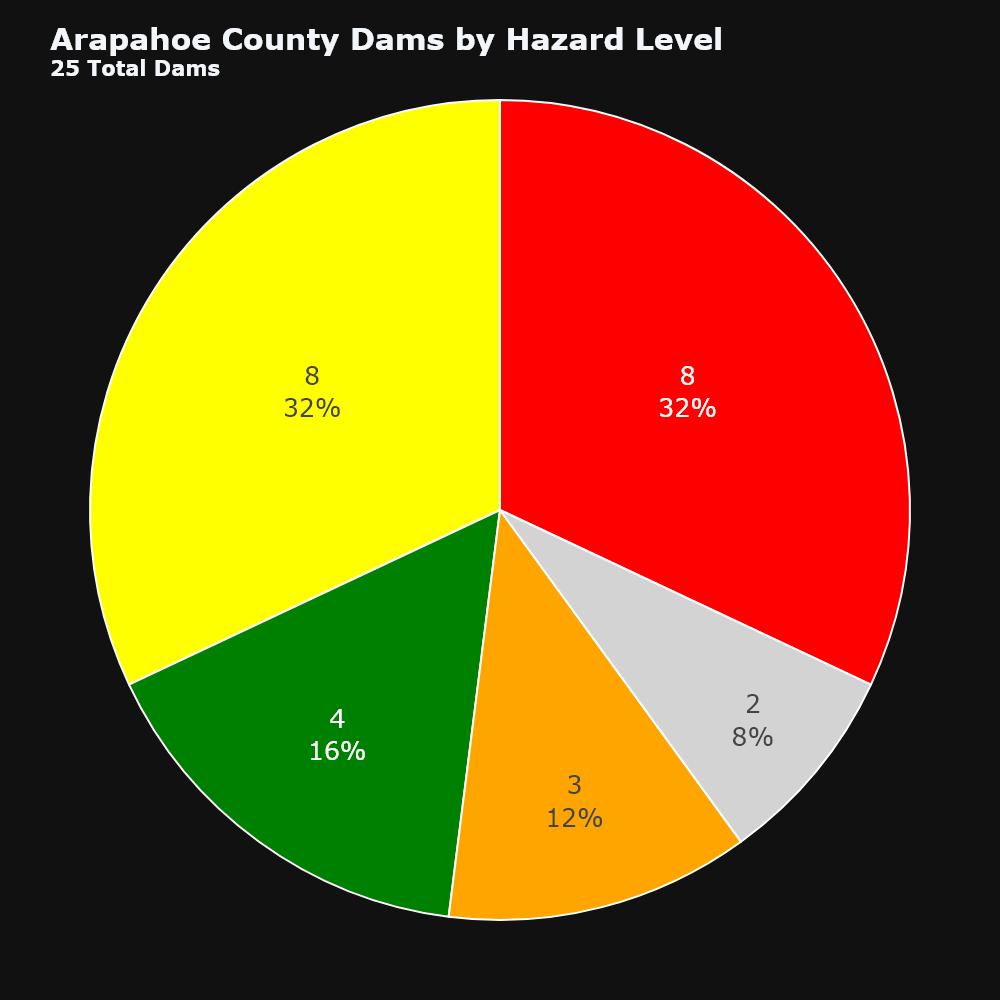
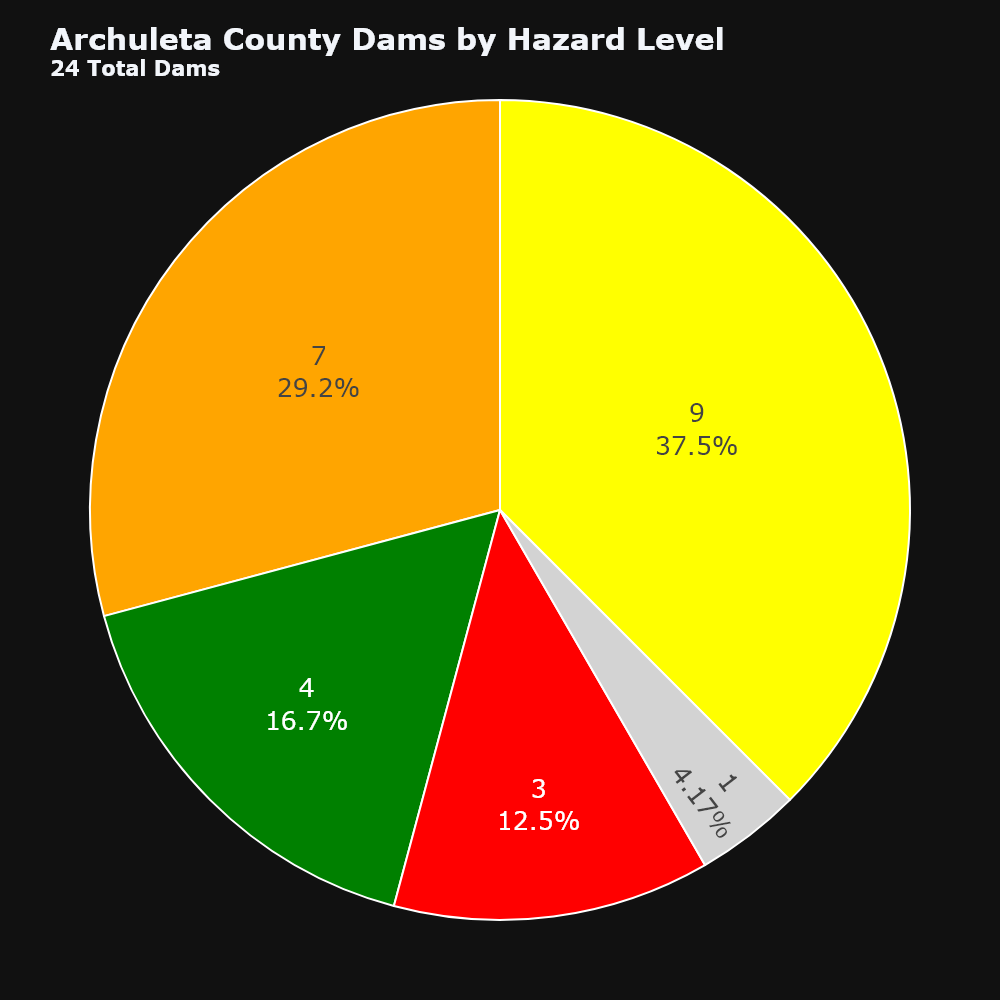
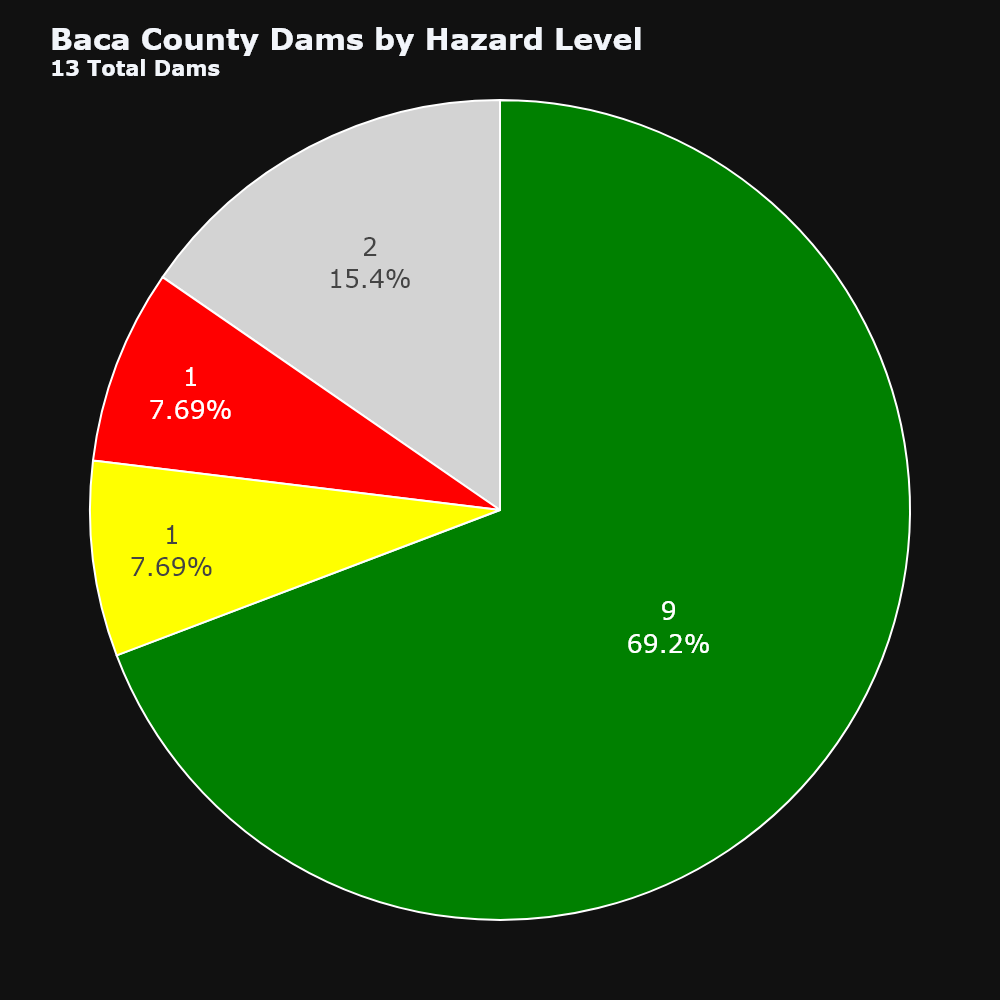
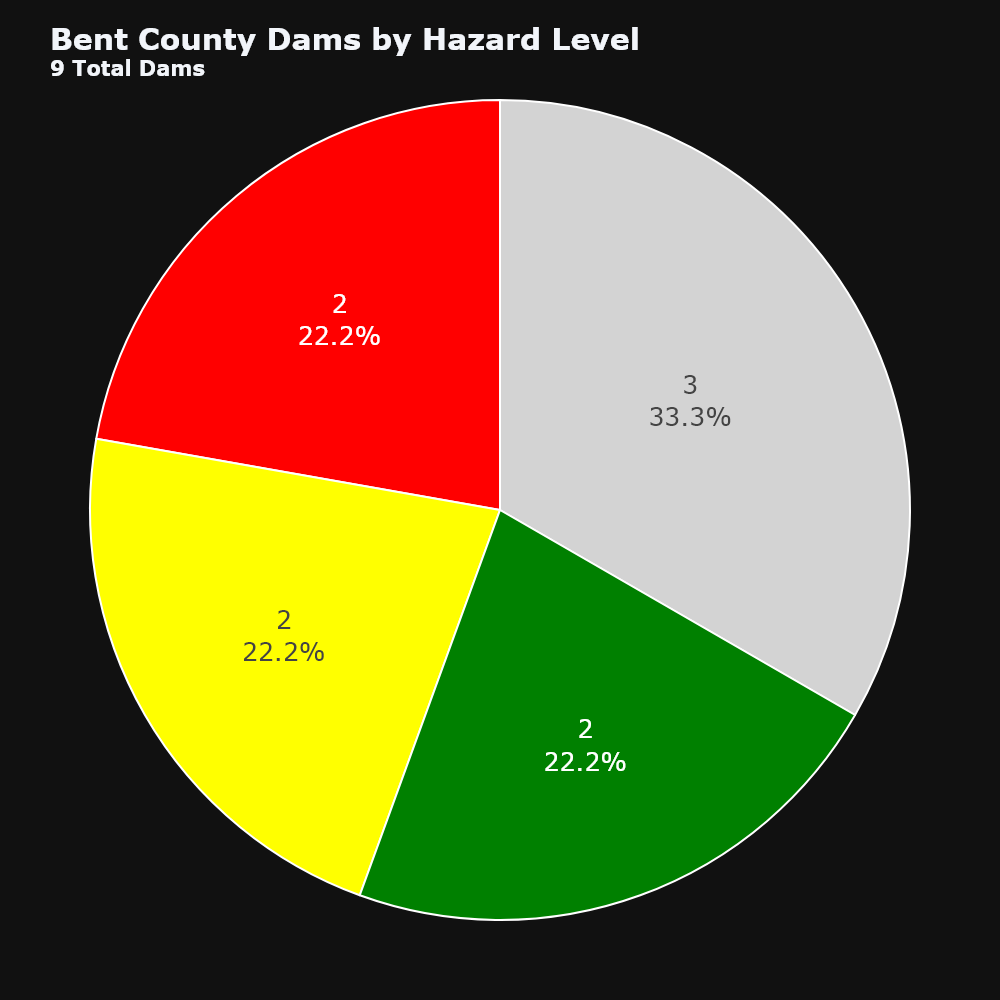
...
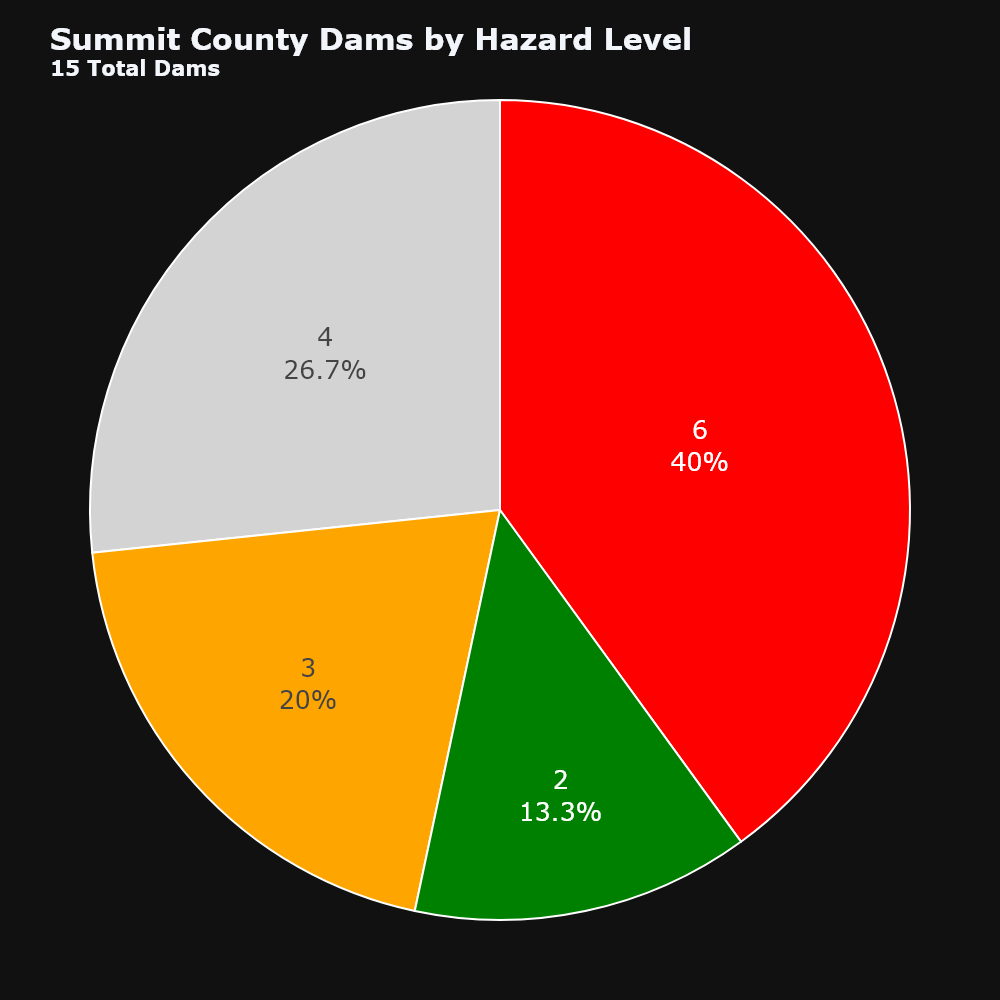
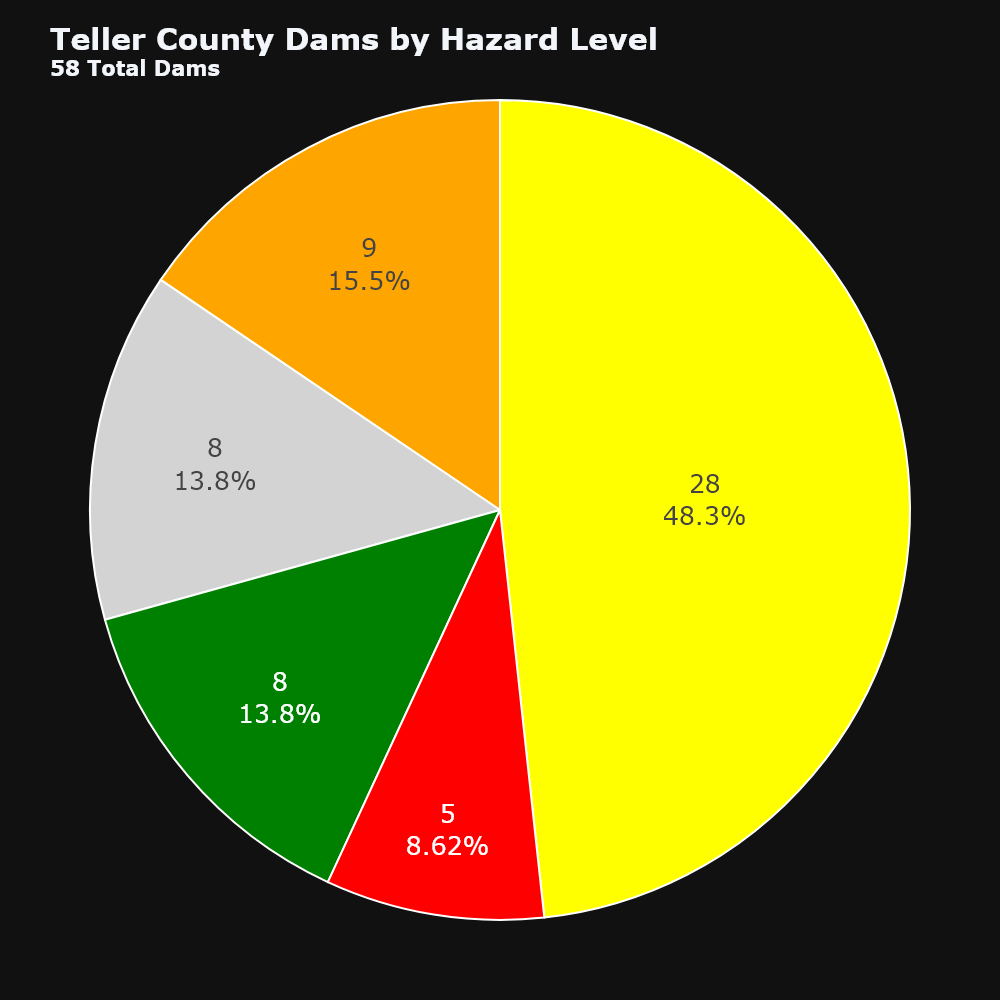
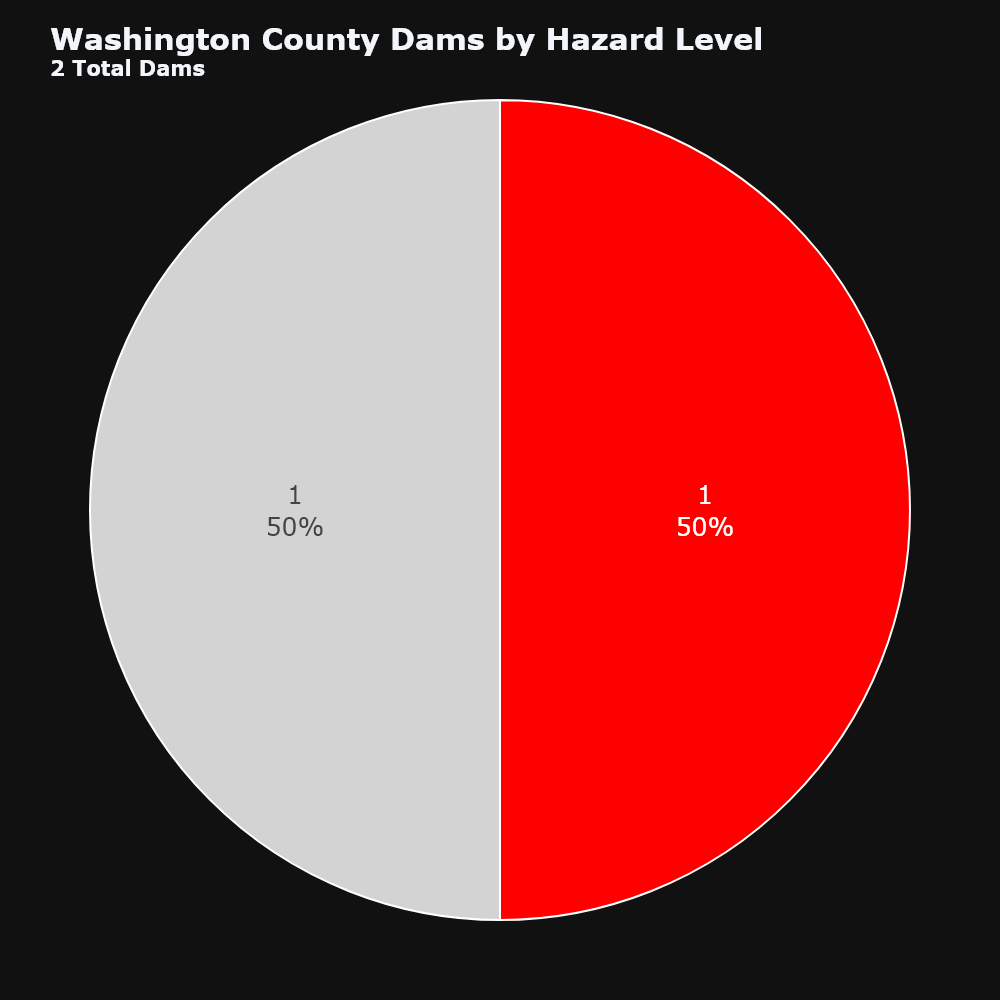
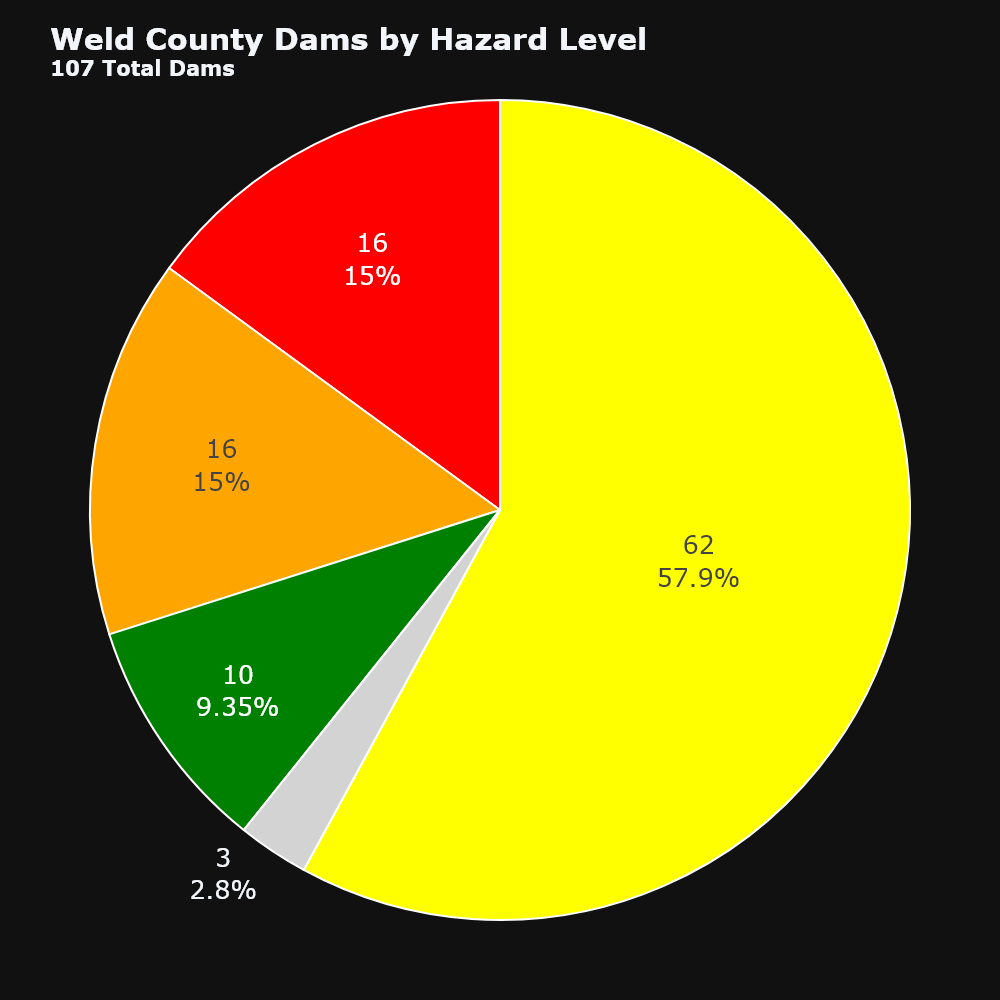
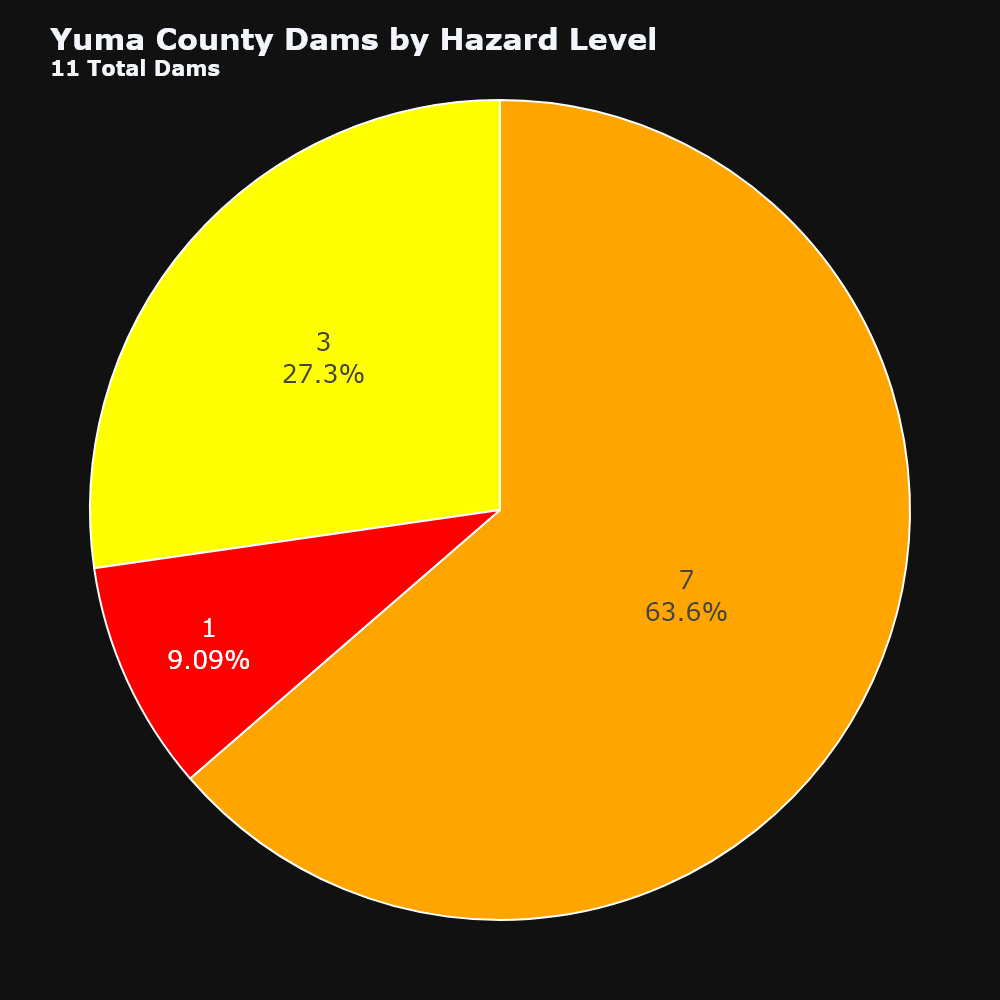

In [40]:
# chatgpt generated the base html/css based on the above map code I fed it, but edited by me

print("Creating a legend for the dam hazard levels on the map and for the pie charts...")
# Create a static legend 
legend_html = '''
<div style="position: fixed; 
            bottom: 45px; right: 25px; width: 200; height: auto; 
            border:1px solid darkgray; z-index:9999; font-size:12px;
            color:white;
            background-color:black;
            padding: 10px 10px 10px 10px;
            ">
  <strong>Dam Hazard Level</strong><br>
  <i class="fa fa-circle marker-color" style="color:green"></i> No Public Hazard<br>
  <i class="fa fa-circle marker-color" style="color:yellow"></i> Low<br>
  <i class="fa fa-circle marker-color" style="color:orange"></i> Significant<br>
  <i class="fa fa-circle marker-color" style="color:red"></i> High<br>
  <i class="fa fa-circle marker-color" style="color:lightgray"></i> No Data/Unknown<br>
</div>
'''

# adding legend to map
co_map.get_root().html.add_child(folium.Element(legend_html))

print("Final map complete.\nTry clicking on one of the counties! Check out the layers!")
# final map
co_map

In [41]:
print("******SCRIPT COMPLETE******")

******SCRIPT COMPLETE******
